In [1]:
import pandas as pd
import numpy as np
import igraph as ig
import collections
import matplotlib
%matplotlib inline

## Explore Data

In [2]:
df_unweighted = pd.read_csv('combined_final_unweighted.csv')
df_unweighted

,node_start,node_end,status
0,Hong Kong,Samoa,jurisdiction
1,Hong Kong,Samoa,jurisdiction
2,Hong Kong,Samoa,jurisdiction
3,Hong Kong,Samoa,jurisdiction
4,Hong Kong,Samoa,jurisdiction
...,...,...,...
338127,Indonesia,British Virgin Islands,officer_base
338128,Cook Islands,British Virgin Islands,officer_base
338129,Hong Kong,British Virgin Islands,officer_base
338130,Cook Islands,United Kingdom,officer_base


In [3]:
df_weighted = pd.read_csv('combined_final_weighted.csv')
df_weighted

,node_start,node_end,status,weight
0,Hong Kong,Samoa,jurisdiction,2.0
1,Hong Kong,Samoa,jurisdiction,2.0
2,Hong Kong,Samoa,jurisdiction,2.0
3,Hong Kong,Samoa,jurisdiction,2.0
4,Hong Kong,Samoa,jurisdiction,2.0
...,...,...,...,...
338119,Indonesia,British Virgin Islands,officer_base,1.0
338120,Cook Islands,British Virgin Islands,officer_base,1.0
338121,Hong Kong,British Virgin Islands,officer_base,1.0
338122,Cook Islands,United Kingdom,officer_base,1.0


In [4]:
df_weighted['status'].unique()

array(['jurisdiction', 'intermediary_base', 'intermediary_jurisdiction',
       'officer_base', 'officer_jurisdiction'], dtype=object)

In [5]:
jurisdiction_list = ['jurisdiction', 'officer_jurisdiction','officer_base']

In [6]:
df_weighted_jur = df_weighted[df_weighted['status'].isin(jurisdiction_list)]
df_jur = df_weighted_jur.drop(['status'], axis = 1)
df_jur

,node_start,node_end,weight
0,Hong Kong,Samoa,2.0
1,Hong Kong,Samoa,2.0
2,Hong Kong,Samoa,2.0
3,Hong Kong,Samoa,2.0
4,Hong Kong,Samoa,2.0
...,...,...,...
338119,Indonesia,British Virgin Islands,1.0
338120,Cook Islands,British Virgin Islands,1.0
338121,Hong Kong,British Virgin Islands,1.0
338122,Cook Islands,United Kingdom,1.0


In [7]:
df_jur_grouped = df_jur.groupby(['node_start','node_end'], as_index = False).sum()
df_jur_grouped

,node_start,node_end,weight
0,Albania,Bahamas,4.0
1,Algeria,British Virgin Islands,2.0
2,Algeria,United Kingdom,2.0
3,Algeria,United States,1.0
4,Andorra,Bahamas,52.0
...,...,...,...
2750,Zimbabwe,Hong Kong,3.0
2751,Zimbabwe,Jersey,1.0
2752,Zimbabwe,Panama,6.0
2753,Zimbabwe,Russia,2.0


### Convert Data to an Undirected Edge List

In [8]:
# df_jur_grouped_list = df_jur_grouped.values.tolist()
# df_jur_grouped_list

In [9]:
# d = collections.defaultdict(int)
# for n1, n2, v in df_jur_grouped_list:
#     d[min(n1, n2), max(n1, n2)] += v
# result = [[k[0], k[1], v] for k, v in d.items()]

In [10]:
# df_net = pd.DataFrame(result)
# df_net

In [11]:
# df_net = df_net.rename(columns = {0:'node_1', 1:'node_2', 2: 'weight'})
# df_net

In [12]:
#df_net.to_csv('undirected_weighted_grouped.csv', index = False)

In [13]:
# df_net.describe()

## Create Graph

In [14]:
g = ig.Graph.TupleList(df_jur_grouped.itertuples(index=False), directed=True, edge_attrs={'weight': "weight"})


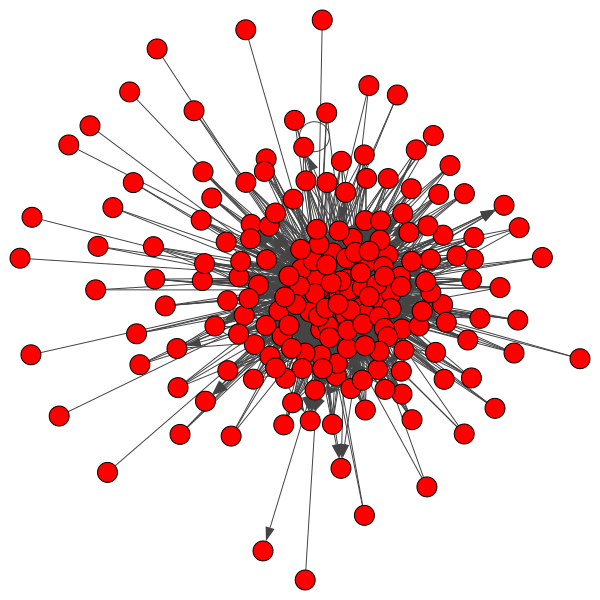

In [15]:
ig.plot(g)

In [16]:
g.diameter()

4

In [17]:
print( "Clustering Coefficient: ", g.transitivity_undirected())

Clustering Coefficient:  0.3829243625911535


In [18]:
np.mean(g.degree())

28.256410256410255

In [19]:
np.mean(g.strength(weights = 'weight'))

5595.635897435897

## Metrics

In [20]:
def get_diameter(community):
    
    diameters = []
    
    for i in range(len(community.subgraphs())):
    
        diameters.append(community.subgraphs()[i].diameter())

    return (diameters)

In [21]:
def get_transitivity(community):
    
    transitivity = []
    
    for i in range(len(community.subgraphs())):
    
        transitivity.append(community.subgraphs()[i].transitivity_undirected())

    return (transitivity)

In [22]:
def get_avg_degree(community):
    
    degree = []
    
    for i in range(len(community.subgraphs())):
    
        degree.append(np.mean(community.subgraphs()[i].degree()))

    return degree

In [23]:
def get_avg_weighted_degree(community):
    
    weighted_degree = []
    
    for i in range(len(community.subgraphs())):
    
        weighted_degree.append(np.mean(community.subgraphs()[i].strength(weights = 'weight')))

    return weighted_degree

## Community Detection

In [24]:
# Define colors used for visualization
colors = ['blue', 'yellow', 'green','purple', 'pink', 'orange', 'lightcoral', 'plum', 'darkgreen', 'darkblue', 'rosybrown',
         'crimson', 'steelblue', 'khaki', 'moccasin', 'orangered', 'fuchsia', 'thistle', 'salmon', 'chocolate', 'lightseagreen',
         'springgreen', 'darkseagreen', 'deeppink', 'mediumvioletred','olive']

### Label Propogation Community Detection

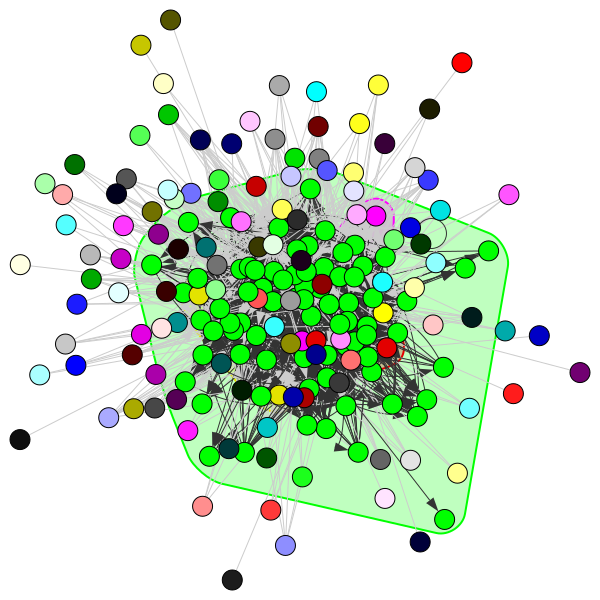

In [25]:
comm_lp= g.community_label_propagation(weights = 'weight')

ig.plot(comm_lp, mark_groups = True, layout="drl")

In [26]:
modularity = g.modularity(comm_lp, weights='weight')
print(modularity)

0.0012668163862697814


In [27]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_lp))
print('average degree: ', get_avg_degree(comm_lp))
print('transitivity: ', get_transitivity(comm_lp))
print('diameter: ', get_diameter(comm_lp))

average weighted degree:  [0.0, 13317.28, 0.0, 0.0, 84.0, 0.0, 0.0, 18.0, 0.0, 0.0, 230.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
average degree:  [0.0, 44.16, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

### Leading Eigenvector Community Detection

/Users/susankoruthu/opt/anaconda3/lib/python3.8/site-packages/igraph/__init__.py:1281: RuntimeWarning: This method was developed for undirected graphs at src/community/leading_eigenvector.c:530
  membership, _, q = GraphBase.community_leading_eigenvector(


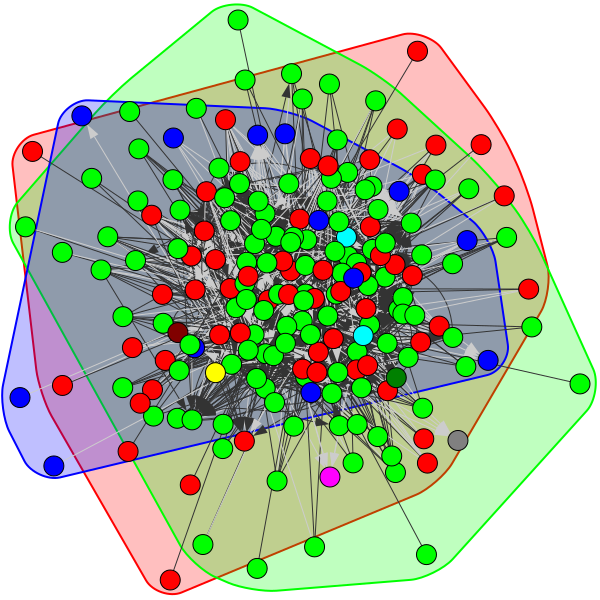

In [28]:
comm_leading_eigenvector= g.community_leading_eigenvector(weights = 'weight')

ig.plot(comm_leading_eigenvector, mark_groups = True, layout="drl")

In [29]:
modularity = g.modularity(comm_leading_eigenvector, weights='weight')
print(modularity)

0.14956936235767823


In [30]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_leading_eigenvector))
print('average degree: ', get_avg_degree(comm_leading_eigenvector))
print('transitivity: ', get_transitivity(comm_leading_eigenvector))
print('diameter: ', get_diameter(comm_leading_eigenvector))

average weighted degree:  [3397.7586206896553, 4895.692307692308, 0.0, 0.0, 0.0, 1.0, 0.0, 16.0, 0.0]
average degree:  [8.206896551724139, 23.53846153846154, 0.0, 0.0, 0.0, 1.0, 0.0, 2.0, 0.0]
transitivity:  [0.27990271943400397, 0.44260359931244436, nan, nan, nan, nan, nan, nan, nan]
diameter:  [3, 3, 0, 0, 0, 1, 0, 0, 0]


In [31]:
df_leading_eigenvector = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_leading_eigenvector.membership } )
df_leading_eigenvector

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,1
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
190,Venezuela,0
191,Vietnam,1
192,Yemen,0
193,Zambia,1


In [32]:
df_leading_eigenvector.describe()

,community
count,195.000000
mean,0.928205
std,1.076925
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,8.000000


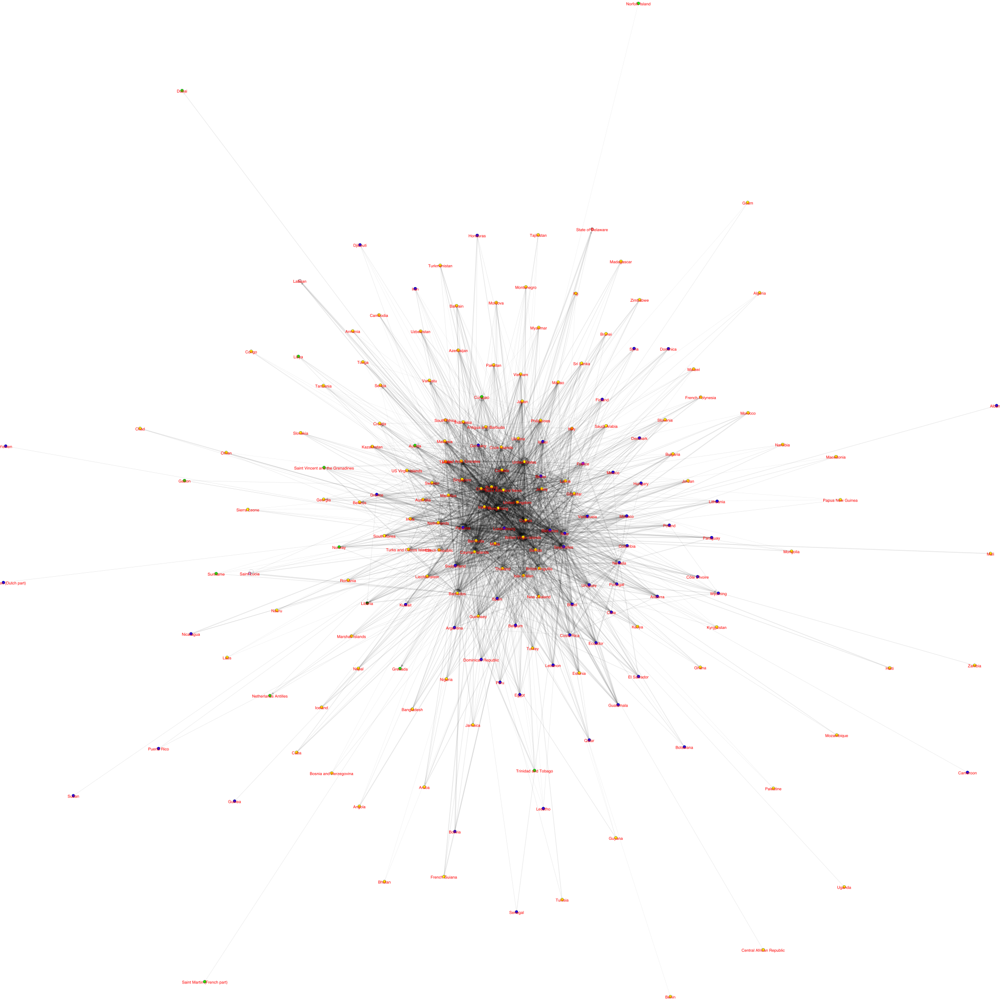

In [33]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_leading_eigenvector.membership)):
    vertex_colors.append(colors[comm_leading_eigenvector.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = np.log(g.es['weight']) + 1

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'directed_no_intermediary_images/communities_leading_eigenvector.png', vertex_label = g.vs['name'] , **visual_style)

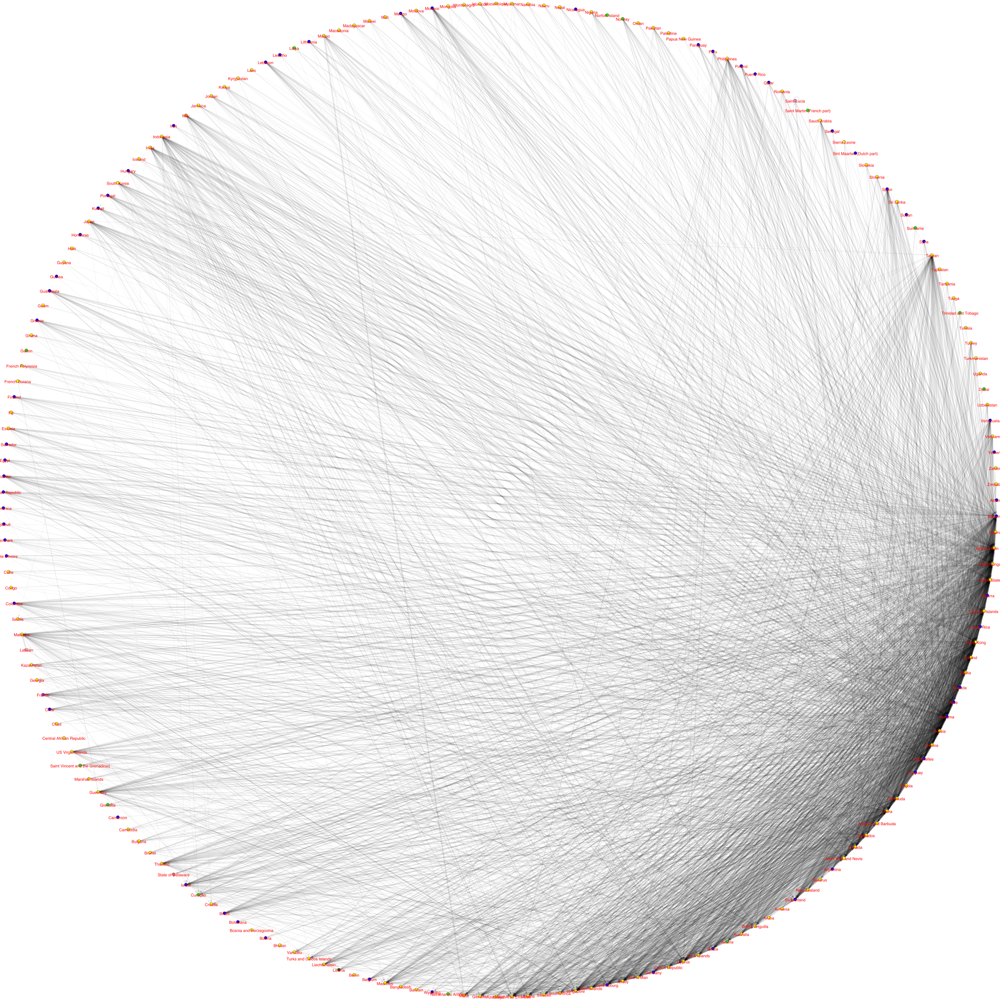

In [34]:
# Set the layout
my_layout = g.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'directed_no_intermediary_images/leading_vector_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [35]:
for i in range(len(comm_leading_eigenvector.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = np.log(comm_leading_eigenvector.subgraphs()[i].es['weight']) + 1
    # Set the layout
    my_layout = comm_leading_eigenvector.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_leading_eigenvector.subgraphs()[i],'directed_no_intermediary_images/leading_eigenvector_subgraph' + str(i) + '.png' ,vertex_label = comm_leading_eigenvector.subgraphs()[i].vs['name'],**visual_style  )
    

### Spinglass Community Detection

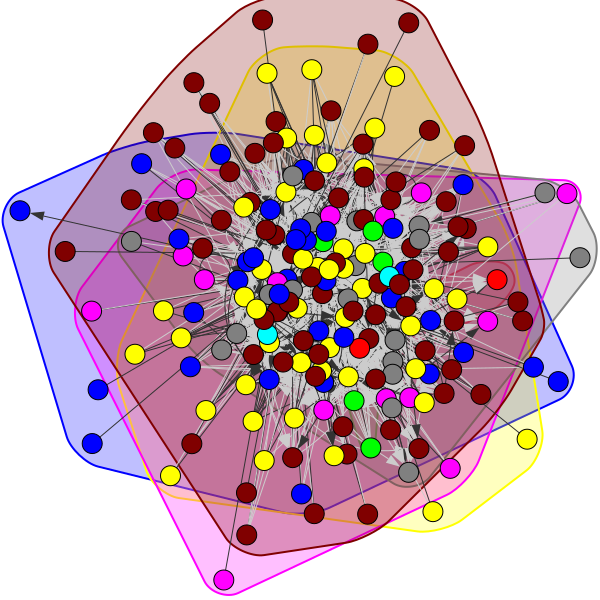

In [36]:
comm_spinglass = g.community_spinglass(weights = 'weight')

ig.plot(comm_spinglass, mark_groups = True, layout="drl")

In [37]:
modularity = g.modularity(comm_spinglass, weights='weight')
print(modularity)

0.054324719949857436


In [38]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_spinglass))
print('average degree: ', get_avg_degree(comm_spinglass))
print('transitivity: ', get_transitivity(comm_spinglass))
print('diameter: ', get_diameter(comm_spinglass))

average weighted degree:  [844.0, 313.6, 2070.9411764705883, 2485.8, 118.26666666666667, 230.0, 1465.157894736842, 1063.6986301369864]
average degree:  [1.0, 2.0, 3.823529411764706, 15.555555555555555, 2.4, 1.0, 4.947368421052632, 3.452054794520548]
transitivity:  [nan, 0.0, 0.1836734693877551, 0.5994241842610365, 0.1111111111111111, nan, 0.39, 0.058233581365253966]
diameter:  [1, 1, 4, 4, 3, 1, 3, 3]


In [39]:
df_spinglass = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_spinglass.membership } )
df_spinglass

,name,community
0,Albania,6
1,Bahamas,6
2,Algeria,3
3,British Virgin Islands,7
4,United Kingdom,3
...,...,...
190,Venezuela,2
191,Vietnam,3
192,Yemen,2
193,Zambia,7


In [40]:
df_spinglass.describe()

,community
count,195.000000
mean,4.630769
std,2.172242
min,0.000000
25%,3.000000
50%,4.000000
75%,7.000000
max,7.000000


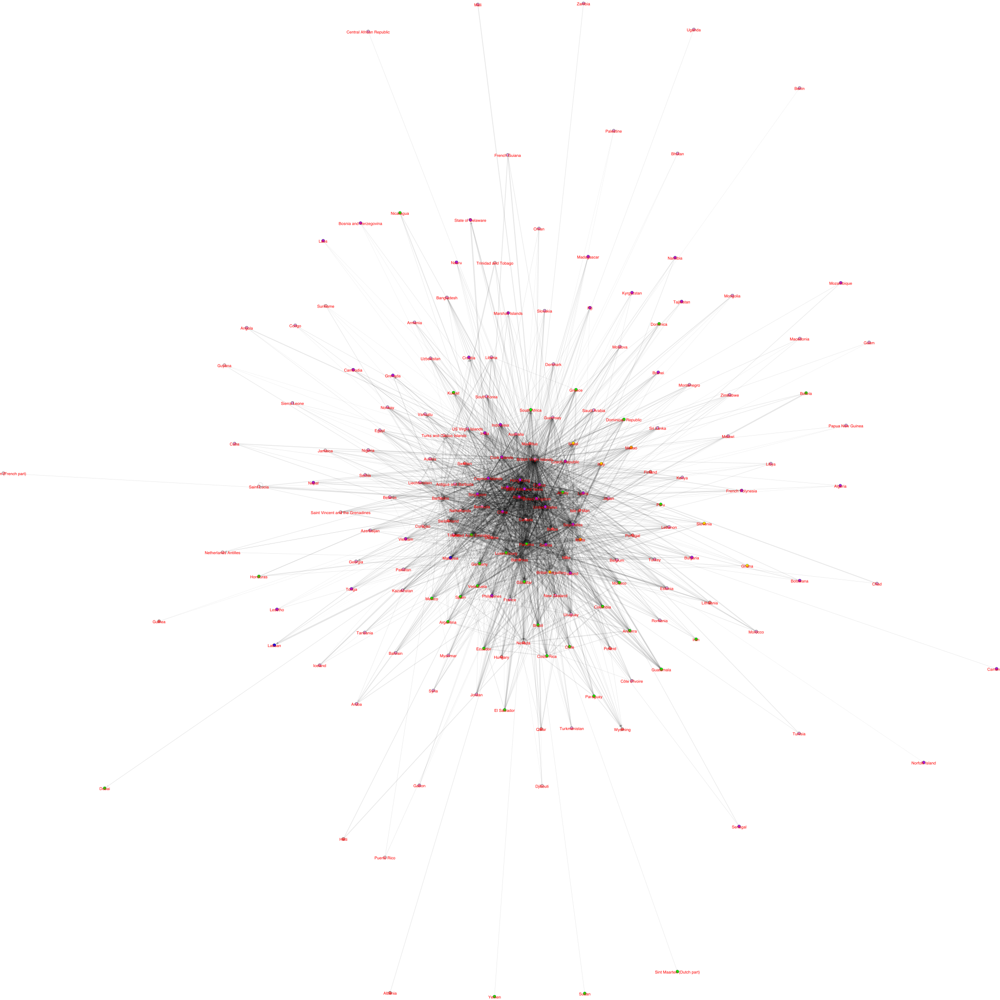

In [41]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_spinglass.membership)):
    vertex_colors.append(colors[comm_spinglass.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = np.log(g.es['weight']) + 1

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'directed_no_intermediary_images/communities_spinglass.png', vertex_label = g.vs['name'] , **visual_style)

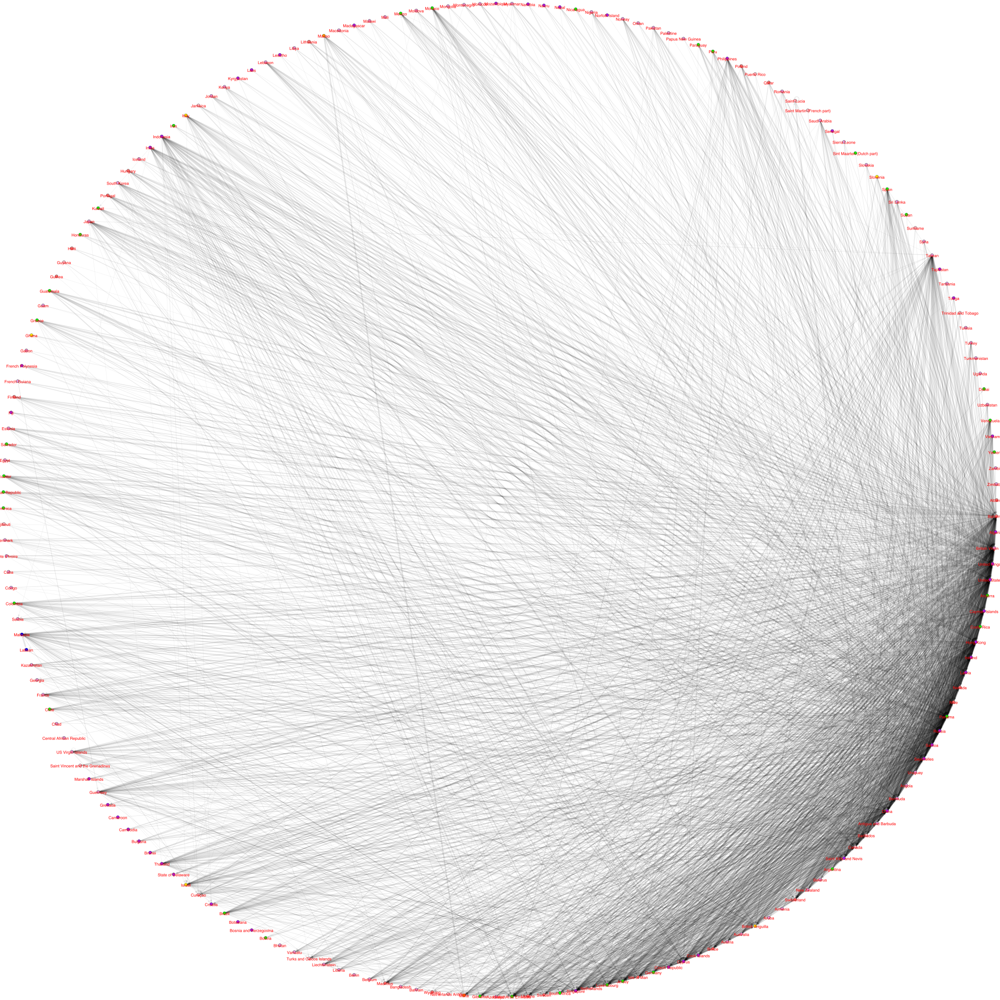

In [42]:
# Set the layout
my_layout = g.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'directed_no_intermediary_images/spinglass_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [43]:
for i in range(len(comm_spinglass.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = np.log(comm_spinglass.subgraphs()[i].es['weight']) + 1
    # Set the layout
    my_layout = comm_spinglass.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_spinglass.subgraphs()[i],'directed_no_intermediary_images/spinglass_subgraph' + str(i) + '.png' ,vertex_label = comm_spinglass.subgraphs()[i].vs['name'],**visual_style  )
    

### Walktrap Community Detection

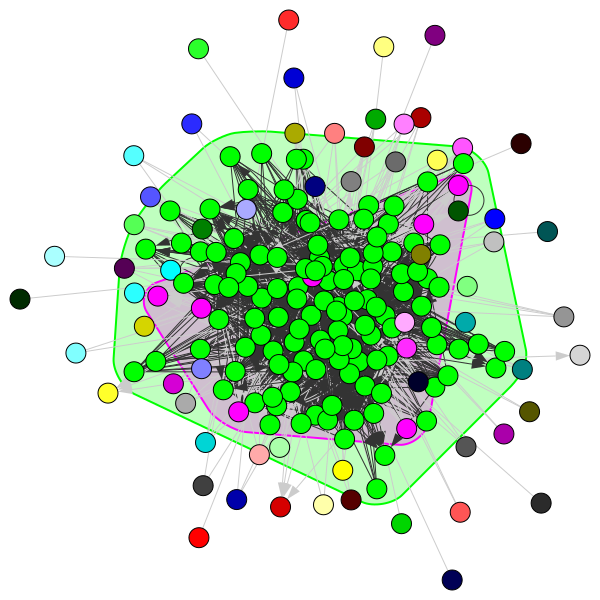

In [44]:
walktrap = g.community_walktrap(weights = 'weight', steps = 2)

comm_walktrap = walktrap.as_clustering()

ig.plot(comm_walktrap, mark_groups = True, layout="drl")

In [45]:
modularity = g.modularity(comm_walktrap, weights='weight')
print(modularity)

0.002879845289073743


In [46]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_walktrap))
print('average degree: ', get_avg_degree(comm_walktrap))
print('transitivity: ', get_transitivity(comm_walktrap))
print('diameter: ', get_diameter(comm_walktrap))

average weighted degree:  [0.0, 8642.008064516129, 0.0, 0.0, 54.285714285714285, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
average degree:  [0.0, 37.903225806451616, 0.0, 0.0, 1.7142857142857142, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
transitivity:  [nan, 0.4614273777519436, nan, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,

In [47]:
df_walktrap = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_walktrap.membership } )
df_walktrap

,name,community
0,Albania,0
1,Bahamas,1
2,Algeria,2
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
190,Venezuela,1
191,Vietnam,1
192,Yemen,63
193,Zambia,64


In [48]:
df_walktrap.describe()

,community
count,195.000000
mean,11.753846
std,18.576144
min,0.000000
25%,1.000000
50%,1.000000
75%,16.500000
max,65.000000


In [49]:
# ##plot community
# visual_style = {}

# vertex_colors = []

# for i in range(len(comm_walktrap.membership)):
#     vertex_colors.append(colors[comm_walktrap.membership[i]])
    
# # Set bbox and margin
# visual_style["bbox"] = (5000,5000)
# visual_style["margin"] = 17

# # Set vertex colours
# visual_style["vertex_color"] = vertex_colors

# # Set edge width
# visual_style["edge_width"] = np.log(g.es['weight']) + 1

# # Set edge color
# visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# # Set vertex size
# visual_style["vertex_size"] = 15

# # Set vertex label size
# visual_style["vertex_label_size"] = 20

# # Set vertex label color
# visual_style["vertex_label_color"] = 'red'

# # Don't curve the edges
# visual_style["edge_curved"] = False

# # Set the layout
# my_layout = g.layout_fruchterman_reingold()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g,'directed_no_intermediary_images/communities_walktrap.png', vertex_label = g.vs['name'] , **visual_style)

In [50]:
# # Set the layout
# my_layout = g.layout_circle()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g,'directed_no_intermediary_images/walktrap_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [51]:
# for i in range(len(comm_walktrap.subgraphs())):
    
#     visual_style["bbox"] = (2000,2000)
#     visual_style["margin"] = 17
    
#     # Set vertex colours
#     visual_style["vertex_color"] = 'green'

#     # Set edge width
#     visual_style["edge_width"] = np.log(comm_walktrap.subgraphs()[i].es['weight']) + 1
#     # Set the layout
#     my_layout = comm_walktrap.subgraphs()[i].layout_fruchterman_reingold()
#     visual_style["layout"] = my_layout

#     ig.plot(comm_walktrap.subgraphs()[i],'directed_no_intermediary_images/walktrap_subgraph' + str(i) + '.png' ,vertex_label = comm_walktrap.subgraphs()[i].vs['name'],**visual_style  )
    

### Infomap Community Detection

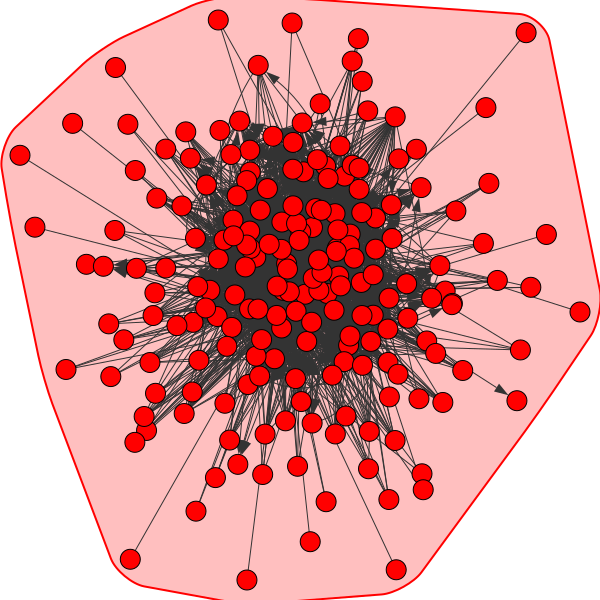

In [52]:
comm_infomap = g.community_infomap(edge_weights = 'weight')

ig.plot(comm_infomap, mark_groups = True, layout="drl")

In [53]:
modularity = g.modularity(comm_infomap, weights='weight')
print(modularity)

0.0


In [54]:
#get metrics for each community

print('average weighted degree: ', get_avg_weighted_degree(comm_infomap))
print('average degree: ', get_avg_degree(comm_infomap))
print('transitivity: ', get_transitivity(comm_infomap))
print('diameter: ', get_diameter(comm_infomap))

average weighted degree:  [5595.635897435897]
average degree:  [28.256410256410255]
transitivity:  [0.3829243625911535]
diameter:  [4]


In [55]:
df_infomap = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_infomap.membership } )
df_infomap

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,0
3,British Virgin Islands,0
4,United Kingdom,0
...,...,...
190,Venezuela,0
191,Vietnam,0
192,Yemen,0
193,Zambia,0


In [56]:
## no visualisation since no community is detected